In [2]:
from torch.utils.data import DataLoader
from validation.validator import TextImageValidator
from validation.dataset import ImageTextDataset
from PIL import Image
import textwrap
import matplotlib.pyplot as plt
import pandas as pd
import math
from tqdm import tqdm

In [3]:
dataset = ImageTextDataset(csv_file='data/data.csv', image_dir='data/images')
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)
batch = next(iter(dataloader))
image_path = batch['image_path'][0]
text = batch['text'][0]

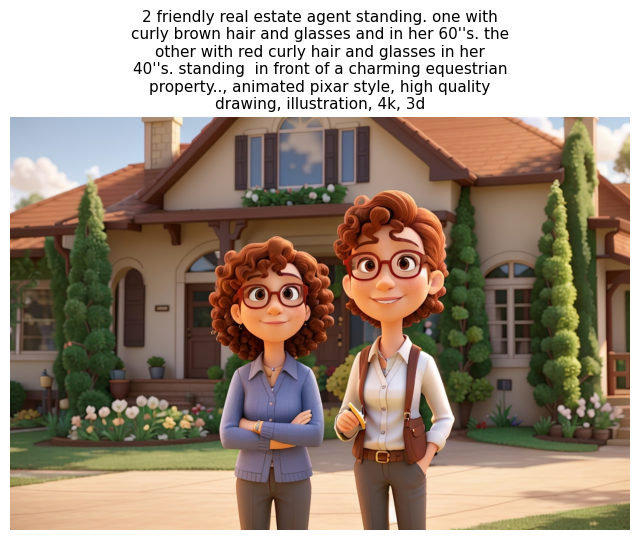

In [4]:
def custom_plt_image_text(ax, image_path, prompt, fontsize, max_line_length=30):
    image = Image.open(image_path)
    wrapped_prompt = textwrap.fill(prompt, width=max_line_length)
    ax.imshow(image)
    ax.axis('off')
    ax.set_title(wrapped_prompt, fontsize=fontsize, loc='center')

fig, ax = plt.subplots(figsize=(8, 6))
custom_plt_image_text(ax, image_path, text, fontsize=11, max_line_length=50)
plt.show()

### Dataset Validation

In [5]:
dataset = ImageTextDataset(csv_file='data/data.csv', image_dir='data/images')
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

clip_validator = TextImageValidator(method='clip', model_name="openai:ViT-L-14-336")
blip_validator = TextImageValidator(method='blip', model_name="blip2-itm")
vqa_validator = TextImageValidator(method='vqa', model_name="clip-flant5-xl")

validators = [clip_validator, blip_validator, vqa_validator]
columns = ['image_path', 'text'] + ['clip_validator', 'blip_validator', 'vqa_validator']
idx = 0
full_dataframe = pd.DataFrame(columns=columns) 
for batch in tqdm(dataloader):
    all_outputs = []
    for validator in validators:
        image_path = batch['image_path'][0]
        text = batch['text'][0]
        output = validator.evaluate([image_path], [text])
        all_outputs.append(output)
    full_dataframe.loc[idx] = [image_path, text] + all_outputs
    idx += 1

INFO:root:Loaded ViT-L-14-336 model config.
INFO:root:Loading pretrained ViT-L-14-336 weights (openai).
INFO:root:freeze vision encoder
INFO:root:load checkpoint from https://storage.googleapis.com/sfr-vision-language-research/LAVIS/models/BLIP2/blip2_pretrained.pth
100%|██████████████████████████████████████████████████████████████████████████████████| 51/51 [44:44<00:00, 52.64s/it]


In [8]:
full_dataframe['clip_score'] = full_dataframe['clip_validator'].apply(lambda x: x.score)
full_dataframe['clip_time'] = full_dataframe['clip_validator'].apply(lambda x: x.inference_time_sec)
full_dataframe['blip_score'] = full_dataframe['blip_validator'].apply(lambda x: x.score)
full_dataframe['blip_time'] = full_dataframe['blip_validator'].apply(lambda x: x.inference_time_sec)
full_dataframe['vqa_score'] = full_dataframe['vqa_validator'].apply(lambda x: x.score)
full_dataframe['vqa_time'] = full_dataframe['vqa_validator'].apply(lambda x: x.inference_time_sec)

In [9]:
full_dataframe.drop(['clip_validator','blip_validator','vqa_validator'], axis=1, inplace=True)

### Time / Memory metrics

In [10]:
performance_df = pd.DataFrame({'model name': {'CLIP ': clip_validator.model_name,
                                              'BLIP ': blip_validator.model_name,
                                              'VQA ': vqa_validator.model_name
                                             },
                               'model size (Mb)': {'CLIP ': clip_validator.model_size,
                                                   'BLIP ': blip_validator.model_size,
                                                   'VQA ': vqa_validator.model_size
                                                  },
                               'time CPU (sec)': {'CLIP ': full_dataframe.clip_time.mean(),
                                                  'BLIP ': full_dataframe.blip_time.mean(),
                                                  'VQA ': full_dataframe.vqa_time.mean()
                                                 }
                              }
)

In [11]:
performance_df

,model name,model size (Mb),time CPU (sec)
CLIP,openai:ViT-L-14-336,1632.500160,3.630247
BLIP,blip2-itm,4473.117912,5.366771
VQA,clip-flant5-xl,6151.668465,43.632356


Mean inference time per sample

In [12]:
performance_df.to_csv('performance_metrics.csv', index=False)

In [13]:
full_dataframe.describe()

,clip_score,clip_time,blip_score,blip_time,vqa_score,vqa_time
count,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000
mean,0.264668,3.630247,0.835615,5.366771,0.657002,43.632356
std,0.042693,0.297454,0.291102,0.553100,0.206517,3.510784
min,0.162109,3.248926,0.000132,4.873699,0.225916,40.206254
25%,0.234375,3.475272,0.837891,5.123989,0.488942,41.187102
50%,0.269531,3.591455,0.988281,5.241863,0.661287,42.546806
75%,0.292969,3.668073,1.000000,5.352755,0.829704,44.600682
max,0.349609,4.868426,1.000000,7.909736,0.967932,54.208466


### Scores distribution

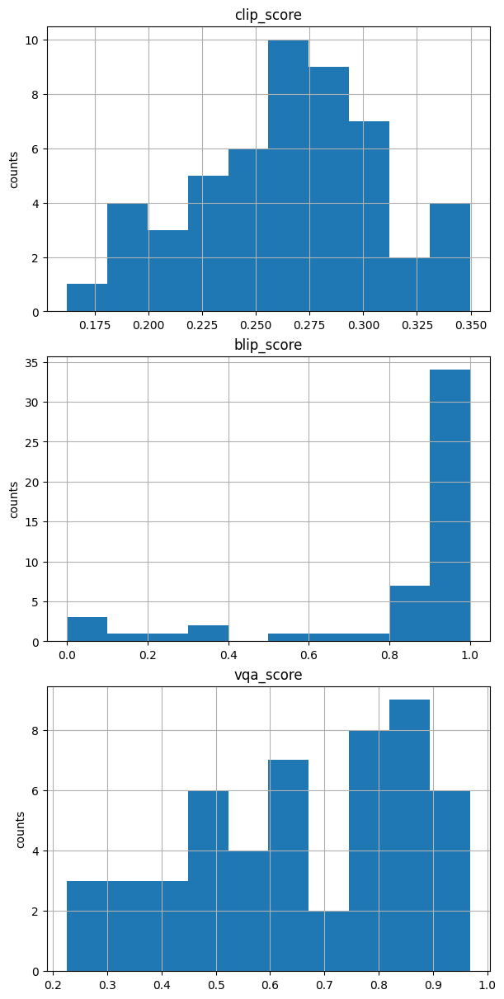

In [14]:
columns = ['clip_score', 'blip_score', 'vqa_score']
fig, axes = plt.subplots(3, 1, figsize=(6, 12), constrained_layout=True)
for i in range(3):
    axes[i].hist(full_dataframe[columns[i]])
    axes[i].set_title(f'Histogram of {columns[i]}')
    axes[i].set_title(columns[i])
    axes[i].set_ylabel('counts')
    axes[i].grid()
plt.show()

### Metrics correlation

In [15]:
full_dataframe[['clip_score', 'blip_score', 'vqa_score']].corr(method='spearman')

,clip_score,blip_score,vqa_score
clip_score,1.000000,0.580394,0.385733
blip_score,0.580394,1.000000,0.410297
vqa_score,0.385733,0.410297,1.000000


BLIP scores and CLIP scores seem to be more highly correlated with each other than with the VQA score

We can look at the least plausible image-text pairs for each metric. BLIP and VQA scores output probabilities, so we can roughly set a threshold of 0.5

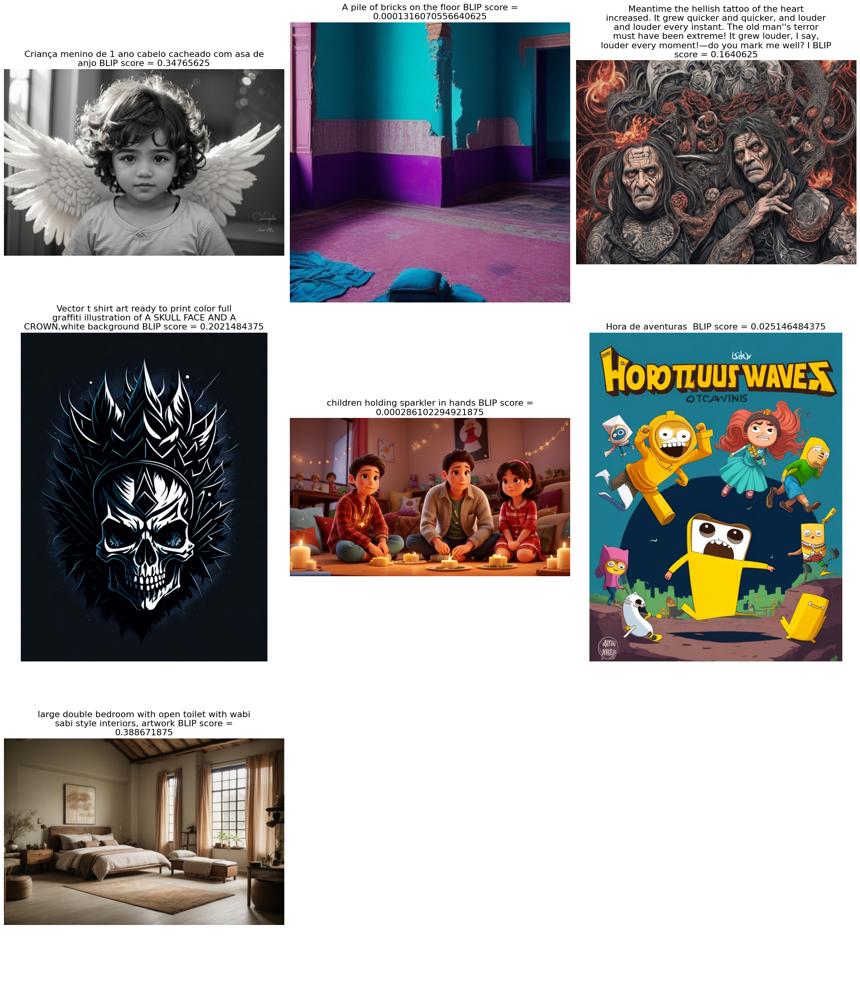

In [16]:
sub_df = full_dataframe.loc[full_dataframe['blip_score'] < 0.5].reset_index(drop=True)
n = len(sub_df)
cols = 3
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(22, 26), constrained_layout=True)
index = 0

for i in range(rows):
    for j in range(cols):
        if index < n:
            image_path = sub_df.loc[index]['image_path']
            text = f"{sub_df.loc[index]['text']} BLIP score = {sub_df.loc[index]['blip_score']}"
            custom_plt_image_text(axes[i][j], image_path, text, fontsize=16, max_line_length=50)
            index += 1
        else:
            axes[i][j].axis('off')

plt.tight_layout()
plt.show()

It seems that BLIP doesn't perform well on non-english texts, as it was not trained as a multilingual model

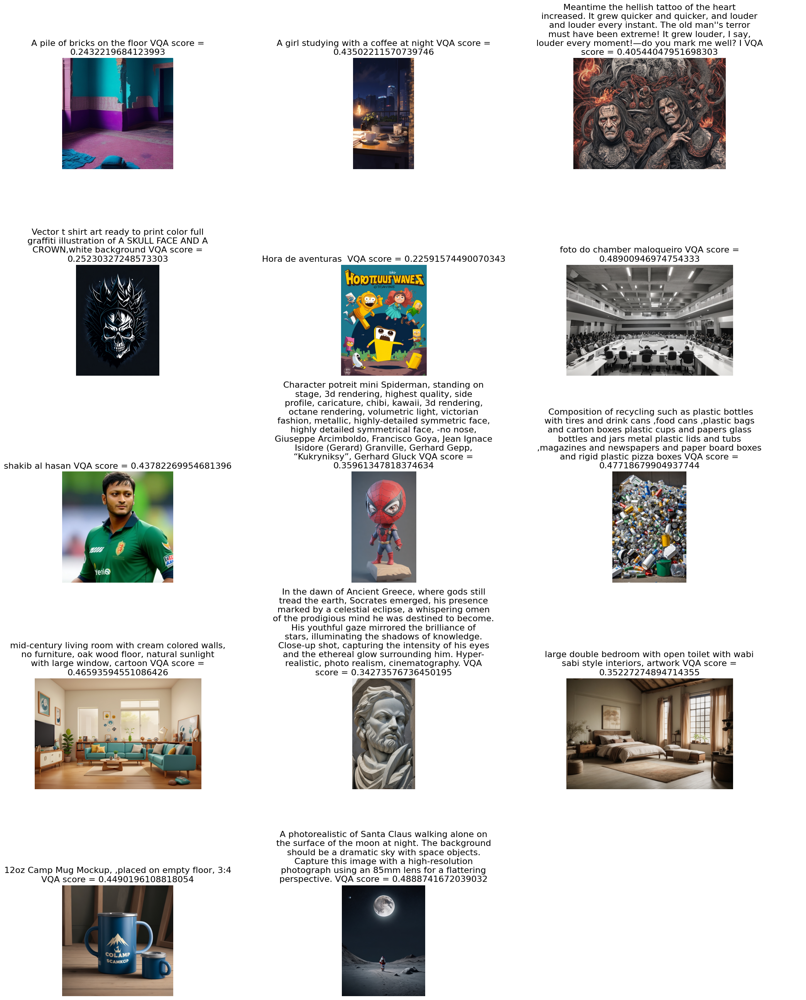

In [17]:
sub_df = full_dataframe.loc[full_dataframe['vqa_score'] < 0.5].reset_index(drop=True)
n = len(sub_df)
cols = 3
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(22, 26), constrained_layout=True)
index = 0

for i in range(rows):
    for j in range(cols):
        if index < n:
            image_path = sub_df.loc[index]['image_path']
            text = f"{sub_df.loc[index]['text']} VQA score = {sub_df.loc[index]['vqa_score']}"
            custom_plt_image_text(axes[i][j], image_path, text, fontsize=16, max_line_length=50)
            index += 1
        else:
            axes[i][j].axis('off')

plt.tight_layout()
plt.show()

For CLIP, we can look at, for example, the 10% quantile

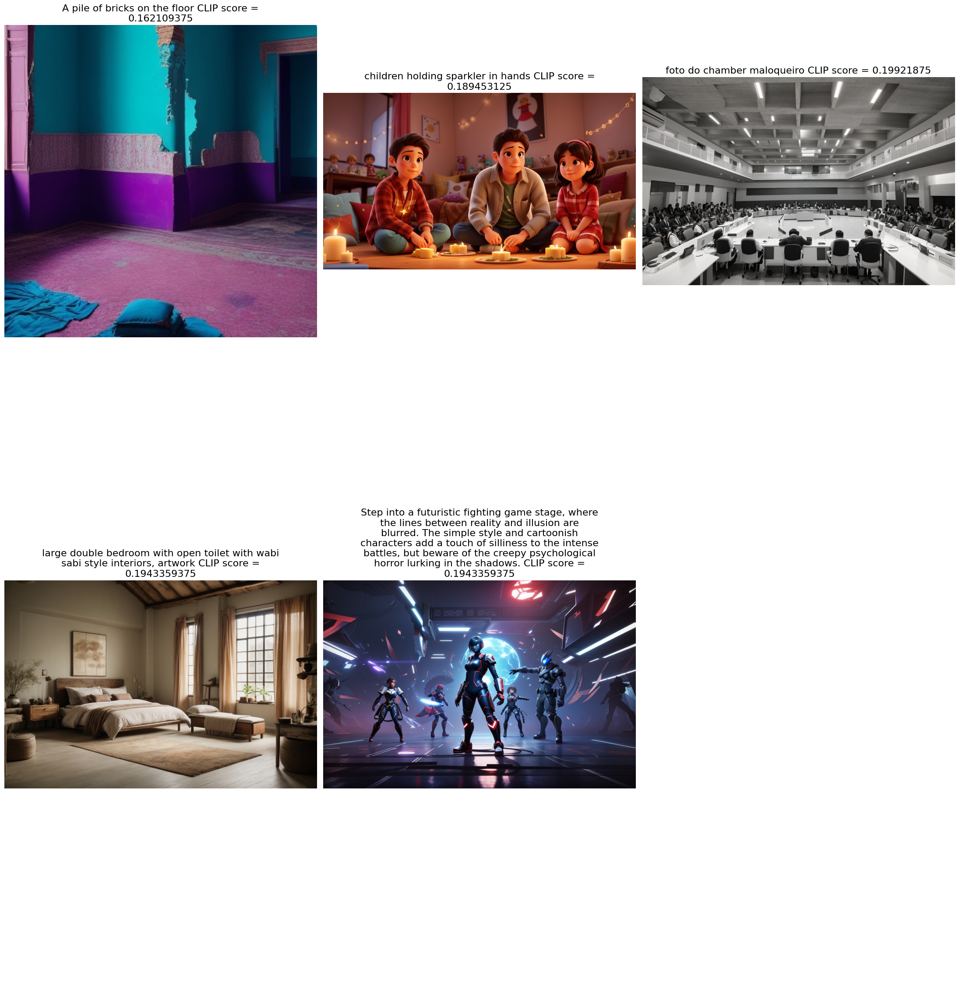

In [18]:
sub_df = full_dataframe.loc[full_dataframe['clip_score'] < full_dataframe['clip_score'].quantile(0.1)].reset_index(drop=True)

n = len(sub_df)
cols = 3
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(22, 26), constrained_layout=True)
index = 0

for i in range(rows):
    for j in range(cols):
        if index < n:
            image_path = sub_df.loc[index]['image_path']
            text = f"{sub_df.loc[index]['text']} CLIP score = {sub_df.loc[index]['clip_score']}"
            custom_plt_image_text(axes[i][j], image_path, text, fontsize=16, max_line_length=50)
            index += 1
        else:
            axes[i][j].axis('off')

plt.tight_layout()
plt.show()

We can see some intersection between the least plausible image-text pairs across different metrics

In order to capture different signals to measure similarities, we can combine several approaches. There is no certain combination, it also depends on time/memory restrictions for specific tasks

In [20]:
full_dataframe.drop(['clip_time','blip_time','vqa_time'], axis=1, inplace=True)
full_dataframe.rename(columns={"text": "caption"}, inplace=True)
full_dataframe.to_csv('imagetext_scores.csv', index=False)